In [127]:
from tensorflow.keras.layers import Input, Dense, Dropout, TimeDistributed, RepeatVector
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import numpy as np
import pandas as pd
import os
import cv2
import xml.etree.ElementTree as ET
from PIL import Image
import math
import tensorflow as tf

In [128]:
def load_rdd2022_dataset(root_folder):
    data = []
    for country_1 in os.listdir(root_folder):
        path_1 = os.path.join(root_folder, country_1)
        if not os.path.isdir(path_1): continue
        for country_2 in os.listdir(path_1):
            path_2 = os.path.join(path_1, country_2)
            if not os.path.isdir(path_2): continue
            train_path = os.path.join(path_2, 'train')
            images_path = os.path.join(train_path, 'images')
            annotations_path = os.path.join(train_path, 'annotations', 'xmls')
            if not os.path.exists(images_path) or not os.path.exists(annotations_path): continue
            for xml_file in os.listdir(annotations_path):
                if not xml_file.endswith('.xml'): continue
                xml_path = os.path.join(annotations_path, xml_file)
                try:
                    tree = ET.parse(xml_path)
                    root = tree.getroot()
                    filename = root.find('filename').text
                    img_path = os.path.join(images_path, filename)
                    for obj in root.findall('object'):
                        label = obj.find('name').text.strip()
                        bbox = obj.find('bndbox')
                        xmin = int(float(bbox.find('xmin').text))
                        ymin = int(float(bbox.find('ymin').text))
                        xmax = int(float(bbox.find('xmax').text))
                        ymax = int(float(bbox.find('ymax').text))
                        data.append([img_path, xmin, ymin, xmax, ymax, label])
                except Exception as e:
                    print(f'❌ Error en {xml_path}: {e}')
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ RDD2022 dataset cargado: {len(df)} muestras")
    return df

In [129]:
def load_humans_dataset(root_folder):
    data = []
    for split in ['train', 'val']:
        images_path = os.path.join(root_folder, 'images', split)
        labels_path = os.path.join(root_folder, 'labels', split)
        if not os.path.exists(images_path) or not os.path.exists(labels_path): continue
        for label_file in os.listdir(labels_path):
            if not label_file.endswith('.txt'): continue
            label_path = os.path.join(labels_path, label_file)
            img_filename = os.path.splitext(label_file)[0] + '.jpg'
            img_path = os.path.join(images_path, img_filename)
            if not os.path.exists(img_path):
                img_filename = os.path.splitext(label_file)[0] + '.png'
                img_path = os.path.join(images_path, img_filename)
                if not os.path.exists(img_path):
                    print(f"⚠️ Imagen no encontrada para {label_path}")
                    continue
            with Image.open(img_path) as img:
                width, height = img.size
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) != 5: continue
                    class_id = parts[0]
                    x_center_rel = float(parts[1])
                    y_center_rel = float(parts[2])
                    width_rel = float(parts[3])
                    height_rel = float(parts[4])
                    xmin = int((x_center_rel - width_rel / 2) * width)
                    ymin = int((y_center_rel - height_rel / 2) * height)
                    xmax = int((x_center_rel + width_rel / 2) * width)
                    ymax = int((y_center_rel + height_rel / 2) * height)
                    data.append([img_path, xmin, ymin, xmax, ymax, class_id])
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ Humans dataset cargado: {len(df)} muestras")
    return df


In [130]:
def load_voc2012_dataset(root_folder):
    images_path = os.path.join(root_folder, 'JPEGImages')
    annotations_path = os.path.join(root_folder, 'Annotations')
    data = []
    for xml_file in os.listdir(annotations_path):
        if not xml_file.endswith('.xml'): continue
        xml_path = os.path.join(annotations_path, xml_file)
        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            filename = root.find('filename').text
            img_path = os.path.join(images_path, filename)
            for obj in root.findall('object'):
                label = obj.find('name').text.strip().lower()
                if label in ['person', 'human']:
                    class_id = 0
                else:
                    class_id = 1
                bbox = obj.find('bndbox')
                xmin = int(float(bbox.find('xmin').text))
                ymin = int(float(bbox.find('ymin').text))
                xmax = int(float(bbox.find('xmax').text))
                ymax = int(float(bbox.find('ymax').text))
                data.append([img_path, xmin, ymin, xmax, ymax, class_id])
        except Exception as e:
            print(f"❌ Error en {xml_path}: {e}")
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ VOC2012 dataset cargado: {len(df)} muestras")
    print(df['label'].value_counts())
    return df



In [131]:
def unify_labels(df, person_labels=set(['person', 'human', 0])):
    def map_label(label):
        if label in person_labels or str(label).lower() in person_labels:
            return 0
        return label
    df['label'] = df['label'].apply(map_label)
    return df

In [132]:
# --------------------------
# 2. DataGenerator corregido
# --------------------------

class MultiBoxDataGenerator(Sequence):
    def __init__(self, df, batch_size=4, img_size=(224, 224), shuffle=True, class_to_idx=None, max_boxes=10):
        self.df = df
        self.batch_size = batch_size
        self.img_size = img_size
        self.shuffle = shuffle
        self.max_boxes = max_boxes
        self.class_to_idx = class_to_idx or {name: idx for idx, name in enumerate(sorted(self.df['label'].unique()))}
        self.groups = df.groupby('image_path')
        self.image_paths = list(self.groups.groups.keys())
        self.on_epoch_end()

    def __len__(self):
        return math.ceil(len(self.image_paths) / self.batch_size)

    def on_epoch_end(self):
        self.indices = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_paths = [self.image_paths[i] for i in batch_indices]
        
        images = []
        batch_bboxes = []
        batch_labels = []

        for img_path in batch_image_paths:
            img = cv2.imread(img_path)
            if img is None:
                print(f"⚠️ Imagen no encontrada: {img_path}")
                continue  # <-- Esto es peligroso
                # en vez de continuar, debes poner cajas vacías

            original_h, original_w = img.shape[:2]
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img, self.img_size)
            img_resized = preprocess_input(img_resized.astype(np.float32))

            boxes = []
            labels = []

            if img_path in self.groups.groups:
                annotations = self.groups.get_group(img_path)
                for _, row in annotations.iterrows():
                    x_min = row['xmin'] / original_w
                    y_min = row['ymin'] / original_h
                    x_max = row['xmax'] / original_w
                    y_max = row['ymax'] / original_h
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(self.class_to_idx[row['label']])
            
            # Rellenar o truncar
            if len(boxes) > self.max_boxes:
                boxes = boxes[:self.max_boxes]
                labels = labels[:self.max_boxes]
            else:
                while len(boxes) < self.max_boxes:
                    boxes.append([0, 0, 0, 0])
                    labels.append(-1)

            images.append(img_resized)
            batch_bboxes.append(boxes)
            batch_labels.append(labels)

        # ✅ Forzar que el batch tenga tamaño constante
        while len(images) < self.batch_size:
            images.append(np.zeros((*self.img_size, 3), dtype=np.float32))
            batch_bboxes.append([[0, 0, 0, 0]] * self.max_boxes)
            batch_labels.append([-1] * self.max_boxes)

        return np.array(images), {
            'bbox': np.array(batch_bboxes, dtype=np.float32),
            'class': np.array(batch_labels, dtype=np.int32)
        }
        


In [133]:
import tensorflow.keras.backend as K

def masked_sparse_categorical_crossentropy(y_true, y_pred):
    """
    Ignora los valores -1 en y_true (etiquetas de padding).
    """
    mask = tf.not_equal(y_true, -1)
    y_true_masked = tf.boolean_mask(y_true, mask)
    y_pred_masked = tf.boolean_mask(y_pred, mask)

    # Cálculo correcto de pérdida solo con elementos válidos
    loss = tf.keras.losses.sparse_categorical_crossentropy(y_true_masked, y_pred_masked)
    return tf.reduce_mean(loss)

def masked_accuracy(y_true, y_pred):
    mask = tf.not_equal(y_true, -1)  # Ignora etiquetas -1
    y_true_masked = tf.boolean_mask(y_true, mask)
    y_pred_masked = tf.boolean_mask(y_pred, mask)
    y_pred_labels = tf.argmax(y_pred_masked, axis=-1)
    correct = tf.equal(tf.cast(y_true_masked, tf.int32), tf.cast(y_pred_labels, tf.int32))
    return tf.reduce_mean(tf.cast(correct, tf.float32))


In [135]:
rdd_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\RDD2022'
humans_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\humans'
voc_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\VOCdevkit\VOC2012'

print("⏳ Cargando datasets...")
df_rdd = load_rdd2022_dataset(rdd_root)
df_humans = load_humans_dataset(humans_root)
df_voc = load_voc2012_dataset(voc_root)

df_humans = unify_labels(df_humans, person_labels=set([0]))
df_voc = unify_labels(df_voc, person_labels=set(['person', 'human', 0]))

df = pd.concat([df_rdd, df_humans, df_voc], ignore_index=True)

clases_a_eliminar = ['block crack', 'd0w0']
df = df[~df['label'].astype(str).str.lower().isin(clases_a_eliminar)].reset_index(drop=True)

df['label'] = df['label'].astype(str)
df['label'] = df['label'].replace({'0': 0})

dfs = []
n_samples = 15000
for label in df['label'].unique():
    subset = df[df['label'] == label]
    if len(subset) > n_samples:
        subset = resample(subset, replace=False, n_samples=n_samples, random_state=42)
    dfs.append(subset)
df_balanced = pd.concat(dfs).sample(frac=1, random_state=42).reset_index(drop=True)

print("✅ Dataset final filtrado y balanceado:")
print(df_balanced['label'].value_counts())

unique_labels = df_balanced['label'].unique()
class_to_idx = {}
idx = 0
class_to_idx[0] = 0  # persona
for label in unique_labels:
    if label != 0:
        class_to_idx[label] = idx + 1
        idx += 1

print("📌 Diccionario único de clases a índices:")
print(class_to_idx)


⏳ Cargando datasets...
✅ RDD2022 dataset cargado: 65712 muestras
✅ Humans dataset cargado: 51846 muestras
✅ VOC2012 dataset cargado: 40138 muestras
label
1    22737
0    17401
Name: count, dtype: int64
✅ Dataset final filtrado y balanceado:
label
D00       15000
0         15000
1         15000
D10       11830
D20       10617
D40        6544
D44        5057
D50        3581
Repair     1046
D43         793
D01         179
D11          45
Name: count, dtype: int64
📌 Diccionario único de clases a índices:
{0: 0, 'D00': 1, 'D40': 2, '1': 3, 'D50': 4, 'D20': 5, 'D10': 6, 'D44': 7, 'Repair': 8, 'D43': 9, 'D01': 10, 'D11': 11}


In [ ]:
# --------------------------
# 4. Dividir en entrenamiento y validación
# --------------------------

df_train, df_val = train_test_split(df_balanced, test_size=0.2, random_state=42)
print(f"Muestras entrenamiento: {len(df_train)}")
print(f"Muestras validación: {len(df_val)}")

train_gen = MultiBoxDataGenerator(df_train, batch_size=4, img_size=(224, 224), class_to_idx=class_to_idx, max_boxes=3)
val_gen = MultiBoxDataGenerator(df_val, batch_size=4, img_size=(224, 224), class_to_idx=class_to_idx, max_boxes=3)

num_classes = len(class_to_idx)
print(f"Número de clases: {num_classes}")

Muestras entrenamiento: 67753
Muestras validación: 16939
Número de clases: 12


In [ ]:
# --------------------------
# 5. Crear el modelo MobileNetV2 con capas descongeladas
# --------------------------
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *

max_boxes = 3
num_classes = len(class_to_idx)

input_tensor = Input(shape=(224, 224, 3))
base_model = EfficientNetB2(include_top=False, weights='imagenet', input_tensor=input_tensor)

# Congelar y descongelar capas
for layer in base_model.layers:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

x = base_model.output  # (batch, 7, 7, channels)
x = Conv2D(256, kernel_size=1, activation='relu')(x)  # compacta canales
x = GlobalAveragePooling2D()(x)  # reduce a (batch, channels)
x = Dense(512, activation='relu')(x)
x = Dropout(0.3)(x)

# Generar diferentes features por box
x = Dense(max_boxes * 128, activation='relu')(x)
x = Reshape((max_boxes, 128))(x)

bbox_output = TimeDistributed(Dense(4), name='bbox')(x)
class_output = TimeDistributed(Dense(num_classes, activation='softmax'), name='class')(x)

model = Model(inputs=input_tensor, outputs=[bbox_output, class_output])

model.compile(
    optimizer=Adam(1e-4),
    loss={'bbox': 'mse', 'class': masked_sparse_categorical_crossentropy},
    metrics={'class': masked_accuracy}
)

In [ ]:
# --------------------------
# 6. Entrenamiento
# --------------------------


early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[early_stop],
    verbose=2
)

print("✅ Entrenamiento finalizado")



Epoch 1/30


c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9348/9348 - 2705s - 289ms/step - bbox_loss: 0.1482 - class_loss: 1.1235 - class_masked_accuracy: 0.5701 - loss: 1.2717 - val_bbox_loss: 0.1222 - val_class_loss: 0.9320 - val_class_masked_accuracy: 0.6238 - val_loss: 1.0542
Epoch 2/30
9348/9348 - 2132s - 228ms/step - bbox_loss: 0.1131 - class_loss: 0.9437 - class_masked_accuracy: 0.6254 - loss: 1.0568 - val_bbox_loss: 0.1152 - val_class_loss: 0.9193 - val_class_masked_accuracy: 0.6326 - val_loss: 1.0344
Epoch 3/30
9348/9348 - 3564s - 381ms/step - bbox_loss: 0.1091 - class_loss: 0.8865 - class_masked_accuracy: 0.6446 - loss: 0.9956 - val_bbox_loss: 0.1199 - val_class_loss: 0.9034 - val_class_masked_accuracy: 0.6402 - val_loss: 1.0233
Epoch 4/30
9348/9348 - 3909s - 418ms/step - bbox_loss: 0.1084 - class_loss: 0.8448 - class_masked_accuracy: 0.6606 - loss: 0.9532 - val_bbox_loss: 0.1260 - val_class_loss: 0.9291 - val_class_masked_accuracy: 0.6430 - val_loss: 1.0551
Epoch 5/30
9348/9348 - 3746s - 401ms/step - bbox_loss: 0.1079 - class_loss:

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

def evaluate_classification_report(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]

        # Extraer etiquetas verdaderas
        class_true = labels['class']  # (batch_size, max_boxes)
        class_true = np.array(class_true)

        # Si están one-hot encoded (poco probable con sparse), convierte
        if class_true.ndim == 3 and class_true.shape[-1] > 1:
            class_true = np.argmax(class_true, axis=-1)

        # Predicciones del modelo
        preds = model.predict(images, verbose=0)
        class_preds_probs = preds[1]  # (batch_size, max_boxes, num_classes)
        class_preds = np.argmax(class_preds_probs, axis=-1)

        # Aplanar
        class_true = class_true.reshape(-1)
        class_preds = class_preds.reshape(-1)

        # Aplicar máscara: ignorar clases con -1 (padding)
        mask = class_true != -1
        class_true = class_true[mask]
        class_preds = class_preds[mask]

        y_true.extend(class_true.tolist())
        y_pred.extend(class_preds.tolist())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Obtener nombres de clases
    class_names = [str(name) for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    all_labels = list(range(len(class_names)))

    print("📊 Reporte de clasificación:")
    print(classification_report(
        y_true,
        y_pred,
        labels=all_labels,
        target_names=class_names,
        digits=4,
        zero_division=0
    ))
# Evaluar el reporte de clasificación
evaluate_classification_report(model, val_gen)


📊 Reporte de clasificación:
              precision    recall  f1-score   support

           0     0.9066    0.8611    0.8833      2952
         D00     0.5983    0.6279    0.6128      2951
         D40     0.4994    0.6193    0.5529      1282
           1     0.8670    0.9096    0.8878      2966
         D50     0.3770    0.3034    0.3362       702
         D20     0.4461    0.4196    0.4325      2152
         D10     0.5251    0.3580    0.4257      2366
         D44     0.4127    0.5758    0.4808      1002
      Repair     0.6861    0.7391    0.7116       207
         D43     0.4000    0.6296    0.4892       162
         D01     0.2871    0.8788    0.4328        33
         D11     0.0000    0.0000    0.0000         7

    accuracy                         0.6382     16782
   macro avg     0.5005    0.5769    0.5205     16782
weighted avg     0.6406    0.6382    0.6349     16782



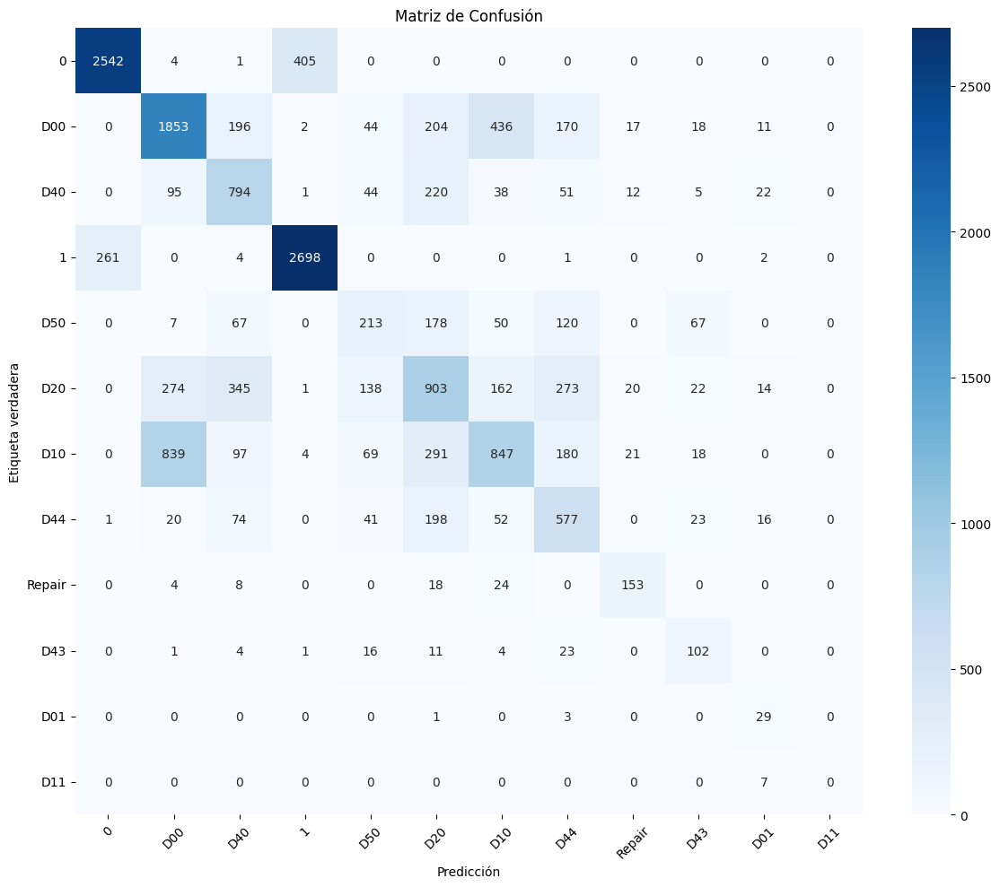

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_confusion_matrix(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]

        class_true = labels['class']  # (batch_size, max_boxes)
        class_true = np.array(class_true)

        if class_true.ndim == 3 and class_true.shape[-1] > 1:
            class_true = np.argmax(class_true, axis=-1)

        # Predicción
        class_probs = model.predict(images, verbose=0)[1]  # (batch_size, max_boxes, num_classes)
        class_preds = np.argmax(class_probs, axis=-1)

        # Aplanar
        class_true = class_true.reshape(-1)
        class_preds = class_preds.reshape(-1)

        # Aplicar máscara (ignorar -1)
        mask = class_true != -1
        class_true = class_true[mask]
        class_preds = class_preds[mask]

        y_true.extend(class_true.tolist())
        y_pred.extend(class_preds.tolist())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    class_names = [name for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicción')
    plt.ylabel('Etiqueta verdadera')
    plt.title('Matriz de Confusión')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Usar la función
plot_confusion_matrix(model, val_gen)


[Box 0] Clase: D00, Confianza: 0.44
[Box 1] Clase: D00, Confianza: 0.44
[Box 2] Clase: D00, Confianza: 0.44


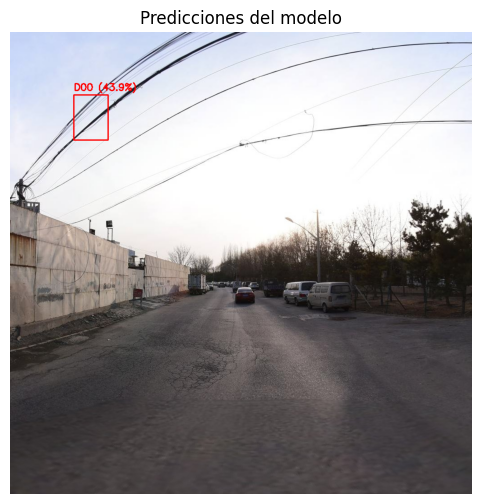

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_on_image(image_path, model, class_to_idx, img_size=(224, 224), max_boxes=3, confidence_threshold=0.1, guardar=False):
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    # Leer imagen
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ No se pudo leer la imagen: {image_path}")
        return

    original = img.copy()
    original_h, original_w = img.shape[:2]

    # Preprocesamiento
    img_resized = cv2.resize(img, img_size)
    img_normalized = img_resized.astype(np.float32) / 255.0
    img_input = np.expand_dims(img_normalized, axis=0)

    # Predicción
    bbox_preds, class_probs = model.predict(img_input, verbose=0)
    bbox_preds = bbox_preds[0]        # (max_boxes, 4)
    class_probs = class_probs[0]      # (max_boxes, num_classes)

    detecciones = 0

    for i in range(max_boxes):
        class_idx = np.argmax(class_probs[i])
        confidence = class_probs[i][class_idx]

        print(f"[Box {i}] Clase: {idx_to_class.get(class_idx)}, Confianza: {confidence:.2f}")

        if confidence < confidence_threshold:
            continue

        class_name = idx_to_class.get(class_idx, "Desconocido")

        # Bounding box (escalado)
        x_min = int(bbox_preds[i][0] * original_w)
        y_min = int(bbox_preds[i][1] * original_h)
        x_max = int(bbox_preds[i][2] * original_w)
        y_max = int(bbox_preds[i][3] * original_h)

        # Color basado en la confianza
        color = (0, 255, 0) if confidence > 0.5 else (0, 0, 255)

        # Dibujar
        cv2.rectangle(original, (x_min, y_min), (x_max, y_max), color, 2)
        label_text = f"{class_name} ({confidence * 100:.1f}%)"
        cv2.putText(original, label_text, (x_min, max(y_min - 10, 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

        detecciones += 1

    if detecciones == 0:
        print("⚠️ No se detectaron objetos con suficiente confianza.")

    # Mostrar imagen
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Predicciones del modelo")
    plt.show()

    # Guardar si se desea
    if guardar:
        output_path = image_path.replace('.', '_pred.')
        cv2.imwrite(output_path, original)
        print(f"✅ Imagen guardada en: {output_path}")

# Ejemplo de uso
ruta_imagen = r"C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\IMG\cocodrilo.jpg"
predict_on_image(ruta_imagen, model, class_to_idx, img_size=(224, 224), max_boxes=3, confidence_threshold=0.1)


📸 Imagen 1 del batch:
   Box 0: D00 (0.39)
   Box 1: D00 (0.39)
   Box 2: D00 (0.39)


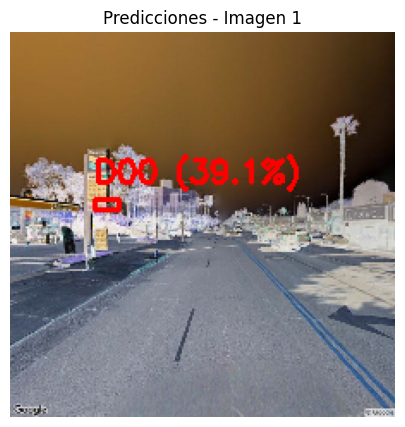


📸 Imagen 2 del batch:
   Box 0: D20 (0.84)
   Box 1: D20 (0.84)
   Box 2: D20 (0.84)


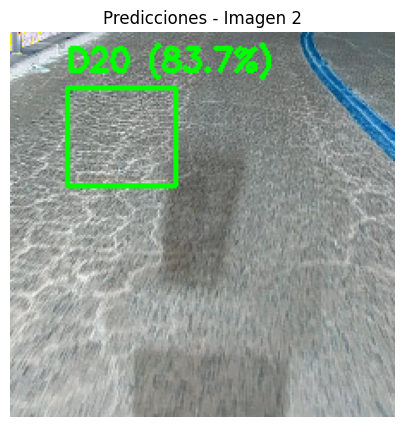


📸 Imagen 3 del batch:
   Box 0: D40 (0.61)
   Box 1: D40 (0.61)
   Box 2: D40 (0.61)


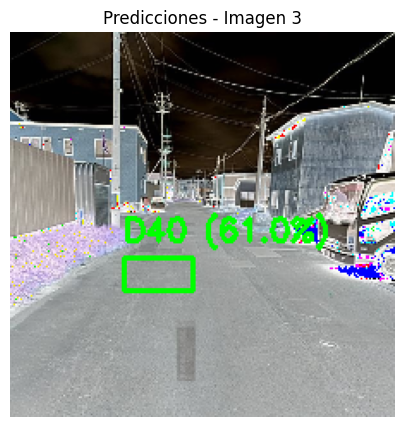


📸 Imagen 4 del batch:
   Box 0: D10 (0.95)
   Box 1: D10 (0.95)
   Box 2: D10 (0.95)


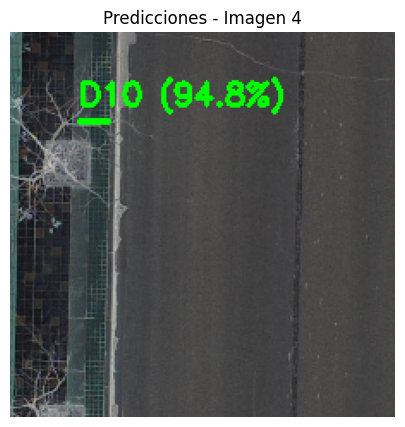

In [ ]:
def test_val_gen_batch(model, val_gen, class_to_idx, batch_index=0, confidence_threshold=0.1):
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    images, labels = val_gen[batch_index]
    true_classes = labels["class"]
    true_boxes = labels["bbox"]

    pred_boxes, pred_probs = model.predict(images, verbose=0)

    batch_size = images.shape[0]

    for i in range(batch_size):
        img = (images[i] * 255).astype(np.uint8)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        original = img.copy()
        h, w = img.shape[:2]

        print(f"\n📸 Imagen {i + 1} del batch:")

        for j in range(pred_boxes.shape[1]):  # max_boxes
            pred_class_idx = np.argmax(pred_probs[i][j])
            confidence = pred_probs[i][j][pred_class_idx]

            if confidence < confidence_threshold:
                continue

            class_name = idx_to_class.get(pred_class_idx, "Desconocido")
            box = pred_boxes[i][j]
            x_min = int(box[0] * w)
            y_min = int(box[1] * h)
            x_max = int(box[2] * w)
            y_max = int(box[3] * h)

            print(f"   Box {j}: {class_name} ({confidence:.2f})")

            color = (0, 255, 0) if confidence > 0.5 else (0, 0, 255)
            cv2.rectangle(original, (x_min, y_min), (x_max, y_max), color, 2)
            label = f"{class_name} ({confidence*100:.1f}%)"
            cv2.putText(original, label, (x_min, max(y_min - 10, 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        plt.figure(figsize=(6, 5))
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Predicciones - Imagen {i + 1}")
        plt.show()

test_val_gen_batch(model, val_gen, class_to_idx, batch_index=0, confidence_threshold=0.1)



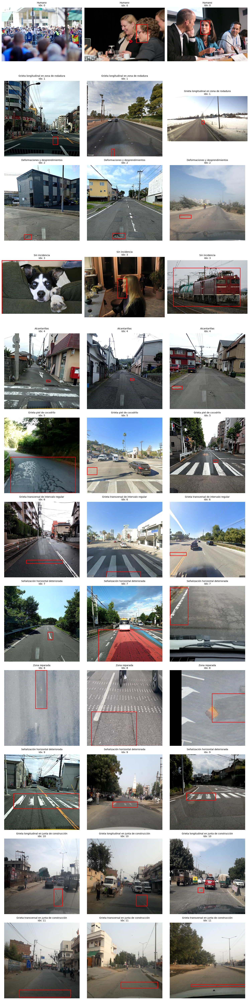

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def cargar_nombres_clases(path_txt):
    clases_desc = {}
    with open(path_txt, 'r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                key, desc = line.strip().split('-', 1)
                clases_desc[key.strip()] = desc.strip()
    return clases_desc

def show_examples_por_clase_con_titulo(df, class_to_idx, path_txt, n_examples=3):
    clases_desc = cargar_nombres_clases(path_txt)
    n_classes = len(class_to_idx)
    
    plt.figure(figsize=(n_examples * 5, n_classes * 5))

    for i, (label, idx) in enumerate(class_to_idx.items()):
        subset = df[df['label'] == label]
        if subset.empty:
            continue

        n_show = min(n_examples, len(subset))
        samples = subset.sample(n_show)

        for j, (_, sample) in enumerate(samples.iterrows()):
            img_path = sample['image_path']
            xmin, ymin, xmax, ymax = sample['xmin'], sample['ymin'], sample['xmax'], sample['ymax']

            img = Image.open(img_path)

            ax = plt.subplot(n_classes, n_examples, i * n_examples + j + 1)
            ax.imshow(img)
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            desc = clases_desc.get(str(label), f"{label} (sin descripción)")
            ax.set_title(f"{desc}\nIdx: {idx}", fontsize=10)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Uso
path_clases = 'clases_extraidas.txt'  # Ajusta si está en otra carpeta
show_examples_por_clase_con_titulo(df_balanced, class_to_idx, path_clases, n_examples=3)
